# SoftUni Deep Learning Exam - Fish Species Recognition

## Created by Konstantin Georgiev

### Email: dragonflareful@gmail.com

### Introduction

In the Western and Cetral Pacific regions, illegal and unregulated fishing activities are threatening the marine ecosystems and local livelihoods. For that reason, The Nature Conservancy has developed and deployed electronic cameras on fishing boats, specifically for monitoring purposes. The pure amount of data that these cameras produce is very expensive to go through manually.


Using Machine Learning algorithms to detect and classify the species of fish, which are caught by the camera, can possibly help automate the reviewing process and can possibly contribute to preserving the fisheries in the future.

### Problem statement

This research is based on the __Nature Conservancy Fisheries Monitoring__ challenge published on __Kaggle__ 2 years ago. The main goal of this challenge was to simply:
 - __Detect and/or classify the species of fish that are captured by the monitoring cameras__

To try and solve this problem, I will explore the provided frames, attempt to create and improve several __Convolutional Neural Networks__ and possibly use other popular image detection architectures (such as __VGG19__). 

### Dataset

_Warning: This data contains graphic contents that some may find disturbing_
 - The Nature Conservancy Fisheries Monitoring dataset - https://www.kaggle.com/c/the-nature-conservancy-fisheries-monitoring/data
 
The images are captured from boat cameras from various angles and each image has only one fish category. __Eight__ categories of fish are present: __Albacore tuna, Bigeye tuna, Yellowfin tuna, Mahi Mahi, Opah, Sharks, No Fish, Other__. The dataset is comprised only of raw images.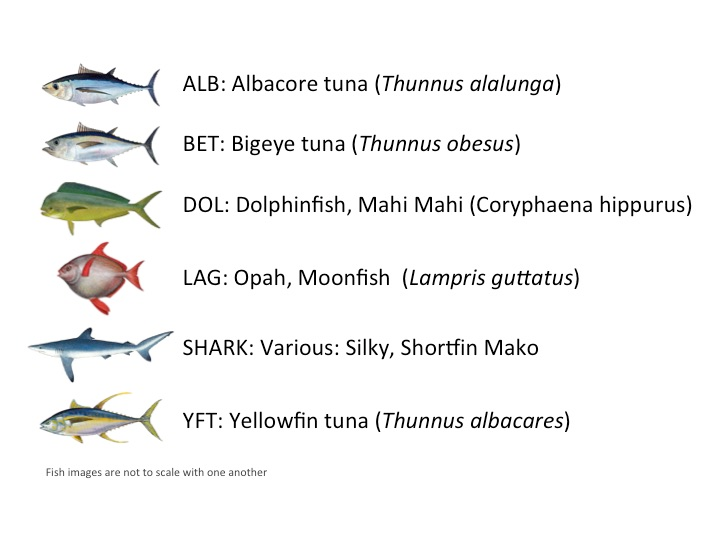

### Libraries

- __pandas__ - filtering the class information
- __matplotlib__ - Exploratory Data Analysis on the dataset and image plotting
- __numpy__ - for image transformation and manipulation, condition-based filtering
- __os__ - file directory traversal and loading
- __scikit-image__ - main image preprocessing algorithms
- __scikit-learn__ - for data preprocessing and model evaluation
- __imblearn__ - dealing with imbalanced data - Oversampling
- __tensorflow (keras)__ - model creation and optimization, image preprocessing - data augmentation

### Project structure

1. Exploring the images and class distributions.
2. Creating the model features and labels.
3. Preprocessing the data - encoding the labels, splitting and balancing the dataset.
4. Creating and evaluating a __baseline CNN model__.
5. Creating and evaluating a __deeper CNN model__ based on the last one.
6. Applying transfer learning using __VGG19__ to classify the species.

We begin by loading the needed libraries and modules.

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import json

from imblearn.over_sampling import RandomOverSampler

from skimage.io import imread, imsave
from sklearn.externals import joblib
from skimage.transform import resize, rotate, rescale
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Dense, Dropout, GaussianNoise, BatchNormalization, Conv2D, MaxPool2D, Flatten, Input, Activation, Add
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import RMSprop, Adam
from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG19

### 1. Exploring the images and class distributions.

I'll begin by defining some important variables, which will be used throughout the project - the directory that contains the images, the known classes and the image dimensions.

Most of the images' shapes are: $1280\times720\times3$. For faster training, I will reduce the image height and width, whilst preserving the aspect ratio, dividing them by __4__: $320\times180\times3$.

In [55]:
input_dir = "fish_data/train/train/"
fish_classes = ['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT']
img_w = 180
img_h = 320
num_channels = 3

This will be a small helper-function to read and resize an image by the specified height and width.

In [56]:
def read_image(src):
    img = imread(src)
    img_resized = resize(img, (img_w, img_h))
    return img_resized 

This function will help us to load all the image file names in a list and see the amount of images in each class. Lets also plot a histogram for a clearer view of the class distributions.

In [57]:
def get_labels_and_class_distributions(directory):
    filenames = []
    class_lengths = []
    for fish in fish_classes:
        fish_dir = directory + '{}'.format(fish)
        images = [fish + '/' + im for im in os.listdir(fish_dir)]
        filenames.extend(images)
        print("{0} photos of {1}".format(len(images), fish)) 
        class_lengths.append(len(images))
    plt.bar(range(len(class_lengths)), class_lengths)
    plt.xticks(range(len(fish_classes)), fish_classes)
    plt.title('Class distribution for fishes')
    plt.xlabel('Class Name')
    plt.ylabel('Count')
    plt.show()
    return filenames

1719 photos of ALB
200 photos of BET
117 photos of DOL
67 photos of LAG
465 photos of NoF
299 photos of OTHER
176 photos of SHARK
734 photos of YFT


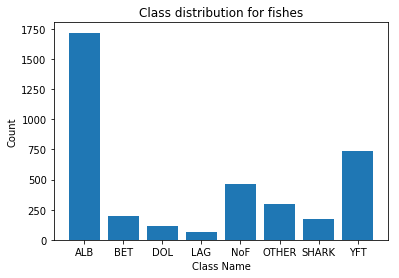

In [58]:
fish_filenames = get_labels_and_class_distributions(input_dir)

In [59]:
print(len(fish_filenames))

3777


From what we can see, there aren't a lot of images - only __3777__ samples and the data is highly imbalanced - one class consists in around __half__ of the samples. We will try to solve this issue later on.

For now, we can visualize what the images look like by plotting a few random samples, along with the class they belong to.

In [60]:
def plot_images(directory, examples=10): 
    for i in range(examples):
        rnd_idx_cl = np.random.randint(0, len(fish_classes))
        rnd_class = fish_classes[rnd_idx_cl]
        rnd_idx = np.random.randint(0, len(os.listdir(directory + '/' + rnd_class)))
        filename = os.listdir(directory + '/' + rnd_class)[rnd_idx]
        img = imread(os.path.join(directory + '/' + rnd_class, filename))
        plt.title(rnd_class)
        plt.imshow(img)
        plt.show()

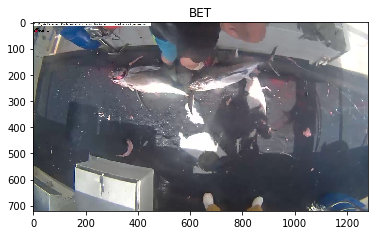

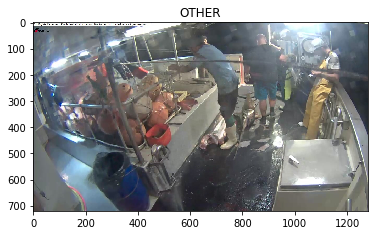

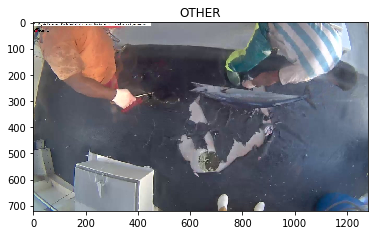

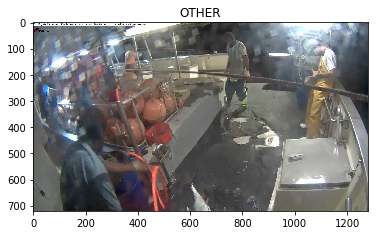

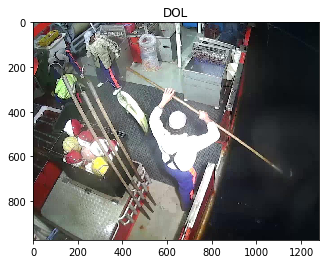

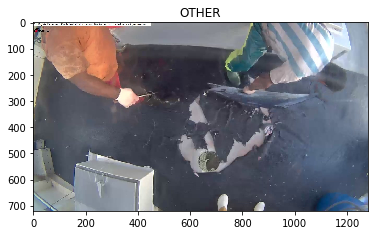

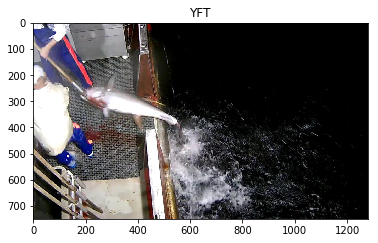

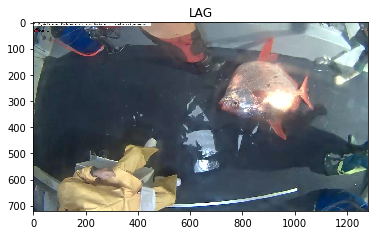

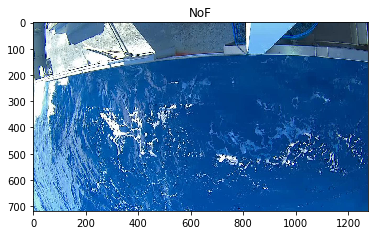

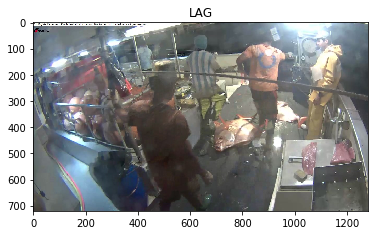

In [61]:
plot_images(directory=input_dir)

We can see that the images are taken at different times of day - the nighttime images might be confusing for the model, because of the drastic change in color. There also samples, where the only parts of a fish is shown and the images that consists of mostly a view of the ocean seem to have no fishes.

### 2. Creating the model features and labels.

Next let's make a helper-function for loading and saving the image features and labels to disk and to a numpy array. We will traverse each class directory, similar to before, read and resize each image, and add a new value to the features and labels list. After the process is done, we'll save the data to disk using __joblib__ and return the values as numpy arrays. 

If the model has already been loaded, we'll simply use __joblib's__ load function.

In [62]:
def load_features(directory, img_w, img_h, loaded=False, features_file = 'fish_features.jbl', 
                  labels_file = 'fish_labels.jbl'):
    features = []
    labels = []
    if loaded:
        print('Loading saved dataset..')
        if os.path.isfile(features_file):
            features = joblib.load(features_file)
        if os.path.isfile(labels_file):
            labels = joblib.load(labels_file)
        print('Done')
        return np.array(features), np.array(labels)
    for fish in fish_classes:
        class_folder = os.listdir(directory + '/' + fish)
        class_folder_name = os.path.join(directory + '/' + fish)
        step = 0
        for filename in class_folder:
            if step % 100 == 0:
                print(('Processed {:.2f}% of {} images').format((step/len(class_folder)) * 100, fish))
            img = imread(os.path.join(class_folder_name, filename))
            img_resized = resize(img, (img_w, img_h))
            features.append(img_resized)
            labels.append(fish)
            step = step + 1

    print('Done')
    if loaded == False:
        print('Saving dataset to disk..')
        #joblib.dump(features, features_file)
        #joblib.dump(labels, labels_file)
    return np.array(features), np.array(labels)

_Note: Uncomment this for first time loading. This process may take a while, as the images are high resolution and the features take aroung 5GB of data, so comment the __jobilib.dump()__ lines if you don't want to save them to disk._

In [63]:
fish_features, fish_labels = load_features(input_dir, img_w=img_w, img_h=img_h)

Processed 0.00% of ALB images


c:\users\user\appdata\local\conda\conda\envs\tf\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
c:\users\user\appdata\local\conda\conda\envs\tf\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


Processed 5.82% of ALB images
Processed 11.63% of ALB images
Processed 17.45% of ALB images
Processed 23.27% of ALB images
Processed 29.09% of ALB images
Processed 34.90% of ALB images
Processed 40.72% of ALB images
Processed 46.54% of ALB images
Processed 52.36% of ALB images
Processed 58.17% of ALB images
Processed 63.99% of ALB images
Processed 69.81% of ALB images
Processed 75.63% of ALB images
Processed 81.44% of ALB images
Processed 87.26% of ALB images
Processed 93.08% of ALB images
Processed 98.89% of ALB images
Processed 0.00% of BET images
Processed 50.00% of BET images
Processed 0.00% of DOL images
Processed 85.47% of DOL images
Processed 0.00% of LAG images
Processed 0.00% of NoF images
Processed 21.51% of NoF images
Processed 43.01% of NoF images
Processed 64.52% of NoF images
Processed 86.02% of NoF images
Processed 0.00% of OTHER images
Processed 33.44% of OTHER images
Processed 66.89% of OTHER images
Processed 0.00% of SHARK images
Processed 56.82% of SHARK images
Proce

And use this if you have the features and labels files.

In [64]:
#fish_features, fish_labels = load_features(input_dir, img_w=img_w, img_h=img_h, loaded=True)

Confirm the shapes after loading..

In [65]:
print(fish_features.shape, fish_labels.shape)

(3777, 180, 320, 3) (3777,)


Now let's plot a few features to confirm that they're still in good quality. Using this helper-function we can either plot __3 random features__ or __the first 3 images from a specific starting point__. We'll hide the axis values, set up a good title and show the images in a _1x3_ grid. 

The _None_ and _False_ variables will be used later on to plot some images that the model has misclassified so we'll leave them for now.

In [66]:
def plot_loaded_features(feature, num_cols=3, num_rows=1, random=1, first_idx=0, custom_label=False, 
                         test_errors=None, test_error_labels=None, test_truth=None):
    f, ax = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15,4))
    idx = first_idx
    for i in range(num_cols):
        if random:
            idx = np.random.randint(0, len(feature))
            plt.suptitle('Random fish features')
        else:
            plt.suptitle('First 3 fish features from start: {}'.format(first_idx))
        ax[i].grid(False)
        ax[i].get_xaxis().set_visible(False)
        ax[i].get_yaxis().set_visible(False)
        if custom_label:
            idx = np.random.randint(0, len(test_errors))
            test_label = np.argmax(test_truth, axis=1)
            ax[i].set_title('Predicted: {}, True:{}'.format(fish_classes[test_error_labels[idx]], 
                                                            fish_classes[test_label[idx]]))
        ax[i].imshow(feature[idx])
        idx += 1
        
    plt.tight_layout()
    plt.show()

def plot_single(feature, random=1): 
    plt.grid(False)
    plt.imshow(feature.reshape(img_w, img_h, num_channels),
               interpolation='nearest',
               cmap='binary')
    plt.show()

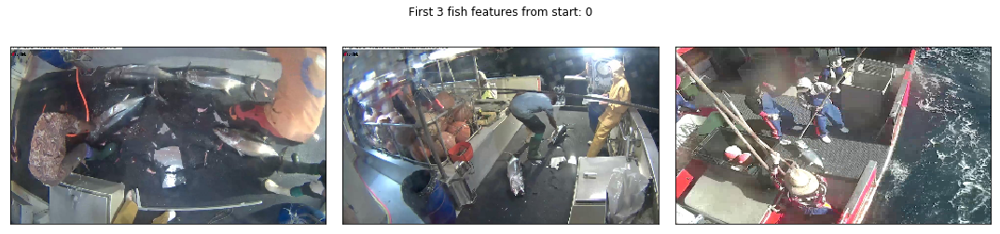

In [67]:
plot_loaded_features(fish_features, random=0)

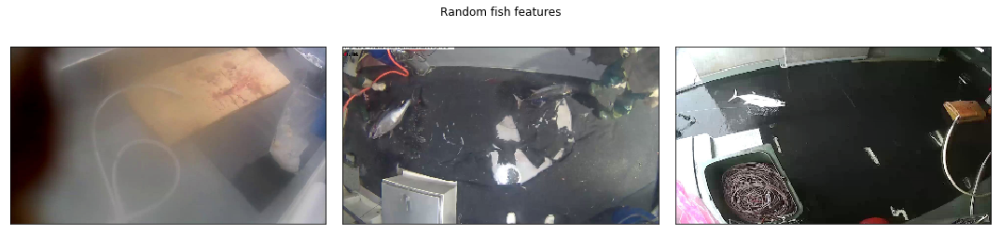

In [68]:
plot_loaded_features(fish_features, random=1)

The images seem to be in good shape, so we can move on to the next step.

### 3. Preprocessing the data - encoding the labels, splitting and balancing the dataset.

Firstly, we can simplify the computations a little bit by converting the fish features data format to _32 bits_.

In [69]:
fish_features.dtype

dtype('float64')

In [70]:
fish_features = fish_features.astype(np.float32)

Now let's split the dataset into a training, validation and test set.

First, we'll do a _90% training / 10% validation_ split. Even though we don't have a lot of data right now, after we balance the classes and generate more samples, the training amount is expected to rise a lot, so it still should be a good idea for achieving stable results.

After that, we'll hold out a few of the training examples for testing and the final distribution will be: __88% training / 10% validation / 2% test__. The validation set will be the main factor for evaluation and the test data will be just for predicting new data that the model has not yet seen for confirmation.

In [71]:
fish_train_features, fish_val_features, fish_train_labels, fish_val_labels = train_test_split(fish_features, fish_labels, test_size=0.1, 
                                                                                              random_state=42,
                                                                                             stratify=fish_labels)

In [72]:
fish_train_features, fish_test_features, fish_train_labels, fish_test_labels = train_test_split(fish_train_features, fish_train_labels, test_size=0.02, 
                                                                                                random_state=42,
                                                                                               stratify=fish_train_labels)

In [73]:
print("Train features:{}, Validation features:{}, Test features:{}".format(fish_train_features.shape, fish_val_features.shape,
                                                              fish_test_features.shape))

Train features:(3331, 180, 320, 3), Validation features:(378, 180, 320, 3), Test features:(68, 180, 320, 3)


In [74]:
print("Train labels:{}, Validation labels:{}, Test labels:{}".format(fish_train_labels.shape, fish_val_labels.shape,
                                                              fish_test_labels.shape))

Train labels:(3331,), Validation labels:(378,), Test labels:(68,)


After splitting, we have: $3331$ training, $378$ validation, $68$ test samples.

In [75]:
len(fish_train_features)

3331

This amount of data is very insufficient for neural networks. 

What we can do to combat this is __Oversampling__. This technique we help us increase the amount of data, whilst simultaneously __balancing__ the data for each class by sampling images (this helps us make , until they amount to the class with the largest amount of samples - __ALB (1516)__. This will also increase the bias in the model, making it harder to overfit. In order to apply this method, we are going to reduce the input to __2D__, fit the __OverSampler__, and reshape it back to __4D__. 

We are going to apply this method only to the training set, in order to have a more realistic evaluation of the model performance.

In [76]:
def balance_data(train_features, train_labels):
    train_features_bal = fish_train_features.reshape(len(fish_train_features), -1)
    ros = RandomOverSampler()
    train_features_bal, train_labels_bal = ros.fit_sample(train_features_bal, fish_train_labels)
    train_features_bal = train_features_bal.reshape(len(train_features_bal), img_w, img_h, num_channels)
    print("Values after balancing:")
    print(pd.value_counts(train_labels_bal))
    return train_features_bal, train_labels_bal

In [77]:
fish_train_features_bal, fish_train_labels_bal = balance_data(fish_train_features, fish_train_labels)

Values after balancing:
YFT      1516
OTHER    1516
NoF      1516
DOL      1516
SHARK    1516
LAG      1516
BET      1516
ALB      1516
dtype: int64


In [78]:
pd.value_counts(fish_train_labels)

ALB      1516
YFT       648
NoF       410
OTHER     264
BET       176
SHARK     155
DOL       103
LAG        59
dtype: int64

Now we can observe the differences in the training set: the samples are now $1516 \times 8 = 12128$.

In [79]:
fish_train_features_bal.shape

(12128, 180, 320, 3)

In [80]:
fish_train_labels_bal.shape

(12128,)

We did reduce and expand the images in the balancing so just to make sure, let's confirm again that they're still in good shape.

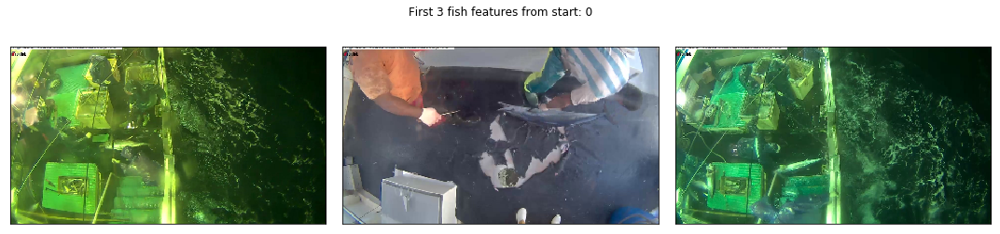

In [81]:
plot_loaded_features(fish_train_features_bal, random=0)

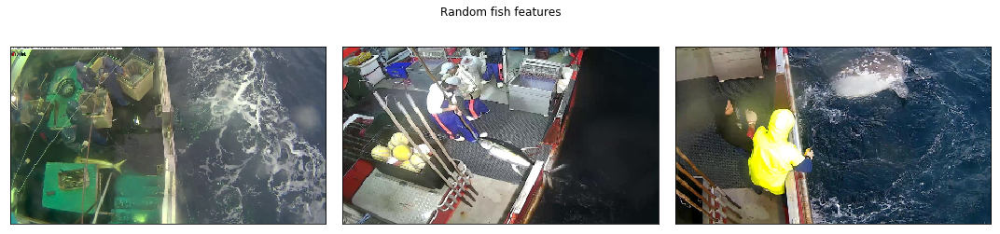

In [82]:
plot_loaded_features(fish_train_features_bal, random=1)

Now all that's left is to preprocess the labels - encode the classes as integers and categorize them into a matrix.

In [83]:
fish_train_labels_ohc = LabelEncoder().fit_transform(fish_train_labels)
fish_train_labels_ohc = to_categorical(fish_train_labels_ohc, num_classes=len(fish_classes))
fish_train_labels_bal_ohc = LabelEncoder().fit_transform(fish_train_labels_bal)
fish_train_labels_bal_ohc = to_categorical(fish_train_labels_bal_ohc, num_classes=len(fish_classes))
fish_test_labels_ohc = LabelEncoder().fit_transform(fish_test_labels)
fish_test_labels_ohc = to_categorical(fish_test_labels_ohc, num_classes=len(fish_classes))
fish_val_labels_ohc = LabelEncoder().fit_transform(fish_val_labels)
fish_val_labels_ohc = to_categorical(fish_val_labels_ohc, num_classes=len(fish_classes))

In [84]:
print(fish_train_labels_bal_ohc.shape, fish_test_labels_ohc.shape, fish_val_labels_ohc.shape)

(12128, 8) (68, 8) (378, 8)


In [85]:
fish_train_labels_ohc

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

### 4. Creating and evaluating a baseline CNN model - 3-Layer.

The training data we have right now is still not a lot so I'm going to apply __Data Augmentation__ to increase the sample size a little bit more. I will use keras's __ImageDataGenerator__ to generate images during the training itself.
The applied transformations are the following:
 - __horizontal and vertical flip__
 - __height and width shift__
 - __rotation__
 - __cropping - shearing and zooming__

The fill mode specifies how the points outside the image boundaries are filled.

In [86]:
idg = ImageDataGenerator(samplewise_center=False, 
                              samplewise_std_normalization=False, 
                              horizontal_flip = True, 
                              vertical_flip = True, 
                              height_shift_range= 0.05, 
                              width_shift_range=0.1, 
                              rotation_range=5, 
                              shear_range = 0.1,
                              fill_mode = 'reflect',
                              zoom_range=0.15)

For the baseline model, I will also add __Early Stopping__ with a relatively large epoch patience based on the training loss and a __Checkpointer__, which will save the best weights of the model to disk, based on the validation accuracy. 

In [87]:
early_stopper = EarlyStopping(monitor='loss', patience=10)
baseline_checkpointer = ModelCheckpoint('best_model_baseline.h5',
                                monitor='val_acc',
                                verbose=1,
                                save_best_only=True,
                                save_weights_only=True)

The loss function will be optimized with __Mini-batch Gradient Descent__ with a batch size of __64__. The initial epochs and number of steps per epoch will be __15__ and __25__. 

This leads to: $64 \times 15 \times 25 = 24000$ augmented training samples, roughly two times more than in the initial training data.

In [88]:
aug_batch_size = 64
aug_num_epochs = 15
aug_num_steps_per_epoch = 25

My first CNN will consist of only __two convolutional layers__ with a __max pooling layer__ in between and 1 __FC__ layer at the end. The padding will always be 'same' for the convolutional layers. The pooling layers will be doing the dimensionality reduction. I will be using the most common activation function __ReLU__ to add nonlinearity to the model. The output out the __FC__ layer will finally be put through a __softmax__ function to generate the final predictions(probabilities) of the model for each of the __8__ classes. 

The chosen loss function is the widely used __Cross Entropy__ for multiple classes, where the loss is:
    $L=-\sum_{k=1}^n y_{0,c} log(p_{0,c})$, where $y$ is the actual and $p$ is the predicted class for each sample. The optimization is done through the __Adam__ optimizer which combines ideas from __momentum__ and __RMSprop__ and produces adaptive learning rates. __Accuracy__ should now be a valid metric, since the data is now balanced.

In [89]:
baseline_model=Sequential()
baseline_model.add(Conv2D(32, kernel_size=5, input_shape=(img_w, img_h, num_channels), activation='relu', padding='same'))
baseline_model.add(MaxPool2D(2))
baseline_model.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
baseline_model.add(Flatten())
baseline_model.add(Dense(len(fish_classes), activation='softmax'))
baseline_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
print(baseline_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 180, 320, 32)      2432      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 90, 160, 32)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 90, 160, 64)       18496     
_________________________________________________________________
flatten_2 (Flatten)          (None, 921600)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 7372808   
Total params: 7,393,736
Trainable params: 7,393,736
Non-trainable params: 0
_________________________________________________________________
None


Now we can select the parameters, specified above and perform the training, along with the augmentation.

In [271]:
#baseline_training = baseline_model.fit_generator(idg.flow(fish_train_features_bal, fish_train_labels_bal_ohc, 
#                                                          batch_size=aug_batch_size),
#                        epochs=aug_num_epochs,
#                        validation_data=[fish_val_features, fish_val_labels_ohc],
#                        steps_per_epoch=aug_num_steps_per_epoch,
#                        callbacks=[baseline_checkpointer])

Epoch 1/15
24/25 [===========================>..] - ETA: 5s - loss: 5.4262 - acc: 0.1914 
Epoch 00001: val_acc improved from -inf to 0.15079, saving model to best_model_baseline.h5
25/25 [==============================] - 136s 5s/step - loss: 5.2865 - acc: 0.1931 - val_loss: 1.9690 - val_acc: 0.1508
Epoch 2/15
24/25 [===========================>..] - ETA: 4s - loss: 1.8190 - acc: 0.3040
Epoch 00002: val_acc improved from 0.15079 to 0.24603, saving model to best_model_baseline.h5
25/25 [==============================] - 132s 5s/step - loss: 1.8306 - acc: 0.3006 - val_loss: 1.9215 - val_acc: 0.2460
Epoch 3/15
24/25 [===========================>..] - ETA: 4s - loss: 1.7881 - acc: 0.3431
Epoch 00003: val_acc improved from 0.24603 to 0.27778, saving model to best_model_baseline.h5
25/25 [==============================] - 131s 5s/step - loss: 1.7818 - acc: 0.3513 - val_loss: 1.8274 - val_acc: 0.2778
Epoch 4/15
24/25 [===========================>..] - ETA: 4s - loss: 1.7756 - acc: 0.3353
Epoc

I will also add two helper-function for saving and loading the training history of the model.

In [90]:
def save_hist(filename, history):
    with open(filename, "w") as write_file:
        json.dump(history, write_file)
def load_hist(filename):
    with open(filename) as read_file:
        train_hist = json.load(read_file)
        return train_hist

After we've saved the history and the weights, we can simply load them from disk and use them for evaluation.

In [91]:
#save_hist('baseline_hist.json', baseline_training.history)
baseline_train = load_hist('baseline_hist.json')
baseline_model.load_weights('best_model_baseline.h5')

The evaluation function consists of the following:
- Plotting the learning curves: __Validation loss curve__ and __Validation accuracy curve__.
- Predicting the __test features__ and displaying a __classification report__.
- Getting the set of __misclassified features and labels__ for the __validation and test sets__ and plotting them.

Additionally I make sure to correctly retrieve the parameters, when the model history is loaded from disk and set the top limit for the learning curve, in case for a large change in the values. The misclassified images are plotted using the previous helper function for visualizing the features. The confusion matrix and report are estimated by comparing the predicted and actual classes of each image.

In [92]:
def plot_test_errors(test_pred, test_truth, test_features, test_labels):
    print('Test errors visualization')
    test_errors = test_features[test_pred != test_truth]
    test_error_labels = test_pred[test_pred != test_truth]
    test_true_labels = test_labels[test_pred != test_truth]
    print('Amount of test errors: {}'.format(len(test_errors)))
    plot_loaded_features(test_features, custom_label=True,
                         test_errors=test_errors,
                        test_error_labels=test_error_labels,
                        test_truth=test_true_labels)
    
def plot_confusion_matrix_and_report(features, labels, model):
    test_pred = model.predict(features)
    print("Classification report")
    test_pred = np.argmax(test_pred, axis=1)
    test_truth = np.argmax(labels, axis=1)
    print(classification_report(test_truth, test_pred, target_names=fish_classes))    

    # Loss function and accuracy
    test_res = model.evaluate(features, labels, verbose=0)
    print('Loss: {}, Accuracy: {}'.format(test_res[0], test_res[1]))
    
    # Confusion Matrix
    print('Confusion matrix.')
    
    cm_test = confusion_matrix(test_truth, test_pred)
    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111)
    cax = ax.matshow(cm_test)
    plt.title('Confusion matrix')
    fig.colorbar(cax)
    ax.set_xticklabels([''] + fish_classes)
    ax.set_yticklabels([''] + fish_classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    
    plt.show()
    
    plot_test_errors(test_pred, test_truth, features, labels)

def plot_learning_curves(training, top_lim=4):
        f, ax = plt.subplots(2,1, figsize=(10, 6))
        ax[0].plot(training['loss'], label="Loss")
        ax[0].plot(training['val_loss'], label="Validation loss")
        if top_lim:
            ax[0].set_ylim(top=top_lim)
        ax[0].set_title('Fish species classification: Validation loss')
        ax[0].set_xlabel('Epoch')
        ax[0].set_ylabel('Loss')
        ax[0].legend()

        ax[1].plot(training['acc'], label="Accuracy")
        ax[1].plot(training['val_acc'], label="Validation accuracy")
        ax[1].set_title('Fish species classification: Validation accuracy')
        ax[1].set_xlabel('Epoch')
        ax[1].set_ylabel('Accuracy')
        ax[1].legend()
        plt.tight_layout()
        plt.show()

def eval_model(training, model, test_features, test_labels, val_features, val_labels, top_lim=4, loaded=False):
    
    if loaded:
        plot_learning_curves(training)
    else:
        plot_learning_curves(training.history)
   
    print('Plotting confusion matrix and report for validation data..')
    plot_confusion_matrix_and_report(val_features, val_labels, model)
    print('Plotting confusion matrix and report for test data..')
    plot_confusion_matrix_and_report(test_features, test_labels, model)
    

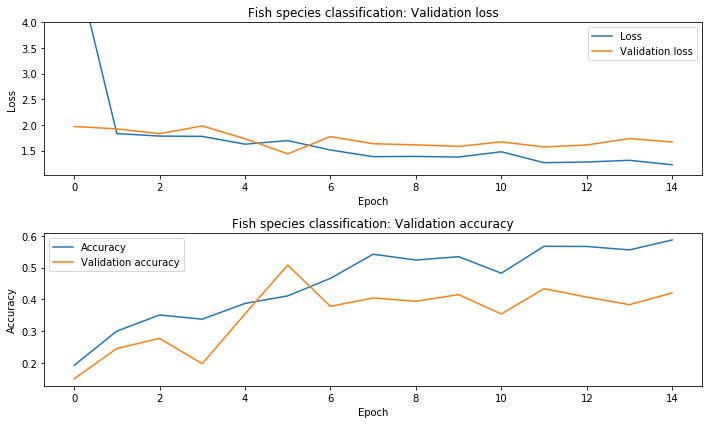

Plotting confusion matrix and report for validation data..
Classification report
              precision    recall  f1-score   support

         ALB       0.62      0.63      0.63       172
         BET       0.20      0.25      0.22        20
         DOL       0.22      0.42      0.29        12
         LAG       1.00      0.43      0.60         7
         NoF       0.60      0.59      0.59        46
       OTHER       0.75      0.10      0.18        30
       SHARK       0.40      0.44      0.42        18
         YFT       0.39      0.44      0.41        73

   micro avg       0.51      0.51      0.51       378
   macro avg       0.52      0.41      0.42       378
weighted avg       0.54      0.51      0.50       378

Loss: 1.4345189414957844, Accuracy: 0.5079365079365079
Confusion matrix.


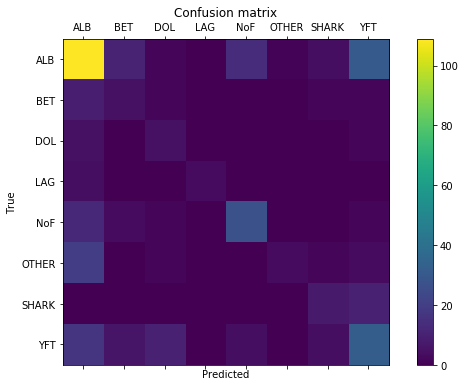

Test errors visualization
Amount of test errors: 186


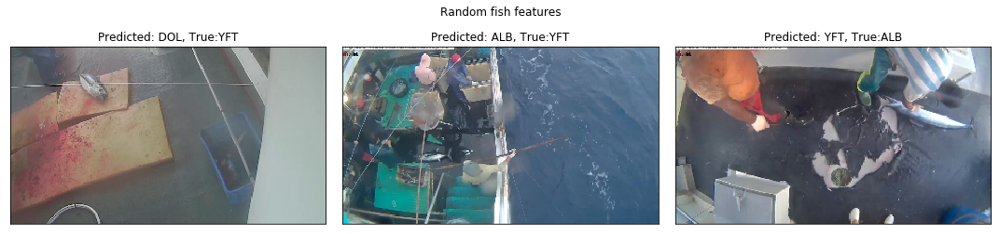

Plotting confusion matrix and report for test data..
Classification report
              precision    recall  f1-score   support

         ALB       0.70      0.68      0.69        31
         BET       0.17      0.25      0.20         4
         DOL       0.29      1.00      0.44         2
         LAG       0.00      0.00      0.00         1
         NoF       0.62      0.56      0.59         9
       OTHER       0.00      0.00      0.00         5
       SHARK       0.40      0.67      0.50         3
         YFT       0.58      0.54      0.56        13

   micro avg       0.56      0.56      0.56        68
   macro avg       0.35      0.46      0.37        68
weighted avg       0.55      0.56      0.55        68



c:\users\user\appdata\local\conda\conda\envs\tf\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Loss: 1.2863382311428295, Accuracy: 0.5588235294117647
Confusion matrix.


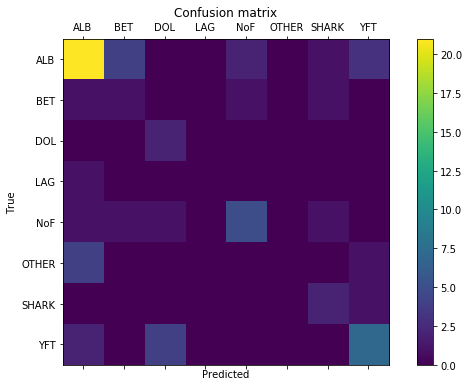

Test errors visualization
Amount of test errors: 30


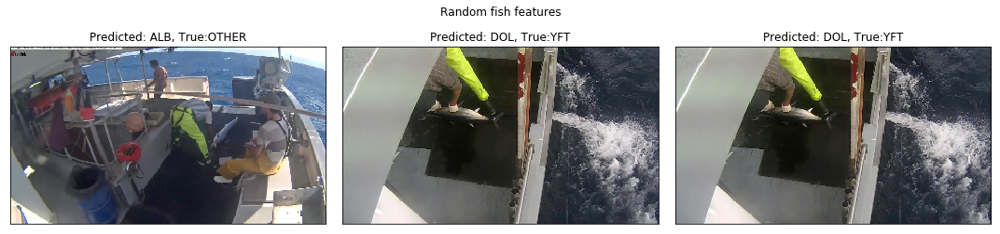

In [93]:
eval_model(baseline_train, baseline_model, fish_test_features, fish_test_labels_ohc, fish_val_features, 
           fish_val_labels_ohc, loaded=True)

From the learning curves, we can observe that the model has an expectedly __high bias__ and still fails to generalize well to unknown data. The __Classification report__ shows a very balanced __F1 score and accuracy__ for both __validation and test sets__. 

Overall, the CNN looks to be producing stable results but suffers from __underfitting__.

An advantage of using __Convolutional Neural Networks__ is that we can also plot the weights and outputs that each layer produces to get a closer look what patterns the model recognizes.

To get a better look at the filters, we can correct the color intensity of the pixels - _lowest - blue, highest - red_ and compare the areas. For these visualizations, I'm going to look at the __red__ channel. 
We can also plot the grayscale output images that each convolutional layer produces. We just need to pass an input image to the __Keras function__, specifying the input and output layers.

In [94]:
def plot_conv_weights(weights, rows, cols, input_channel=0):
    w_min = np.min(weights)
    w_max = np.max(weights)

    num_filters = weights.shape[3]
    
    # Create figure with a grid of sub-plots.
    fig, axes = plt.subplots(rows, cols)
    fig.suptitle("Convolutional weights")
    # Plot all the filter-weights.
    for i, ax in enumerate(axes.flat):
        if i<num_filters:
            # Get the weights for the i'th filter of the input channel.
            img = weights[:, :, input_channel, i]

            # Plot image.
            ax.imshow(img, vmin=w_min, vmax=w_max,
                      interpolation='nearest', cmap='seismic')
        
        # Remove ticks from the plot.
        ax.set_xticks([])
        ax.set_yticks([])
    
    plt.show()

def plot_conv_output(values, rows, cols):
    # Number of filters used in the conv. layer.
    num_filters = values.shape[3]
     
    # Create figure with a grid of sub-plots.
    fig, axes = plt.subplots(rows, cols, figsize=(50,25))
    fig.suptitle("Convolutional outputs", fontsize=50)
    # Plot the output images of all the filters.
    for i, ax in enumerate(axes.flat):
        if i<num_filters:
            # Get the output image using the i'th filter.
            img = values[0, :, :, i]

            # Plot image.
            ax.imshow(img, interpolation='nearest', cmap='binary')
        
        # Remove ticks from the plot.
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()    

In [95]:
baseline_model.layers

And we'll also add some helper-functions to get the weights and outputs from a layer and call the respective methods.

In [96]:
def plot_weights(layer, rows, cols, input_channel=0):
    weights = layer.get_weights()[0]
    print("Filter shape:{}".format(weights.shape))
    print("Plotting convolutional weights..")
    
    plot_conv_weights(weights=weights, rows=rows, cols=cols, input_channel=input_channel)

def plot_outputs(input_image, input_layer, output_layer, rows, cols):
    output = K.function(inputs=[input_layer.input],
                          outputs=[output_layer.output])
    layer = output([[input_image]])[0]
    print("Output layer shape:{}".format(layer.shape))
    print("Plotting layer output..")
    plot_conv_output(values=layer, rows=rows, cols=cols)

Filter shape:(5, 5, 3, 32)
Plotting convolutional weights..


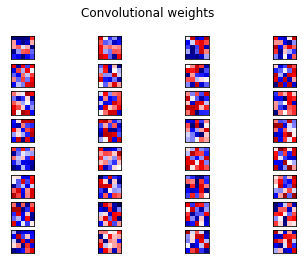

In [97]:
plot_weights(baseline_model.layers[0], rows=8, cols=4)

Filter shape:(3, 3, 32, 64)
Plotting convolutional weights..


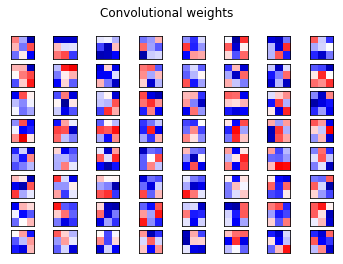

In [98]:
plot_weights(baseline_model.layers[2], rows=8, cols=8)

The kernels for each layer seem relatively balanced. Let's look at the outputs generated for an image from the test set.

In [99]:
test_image = fish_test_features[22]

In [100]:
test_image.shape

(180, 320, 3)

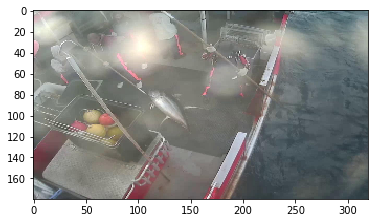

In [101]:
plot_single(test_image)

We pass this image to the network layers and observe the following results.

Output layer shape:(1, 180, 320, 32)
Plotting layer output..


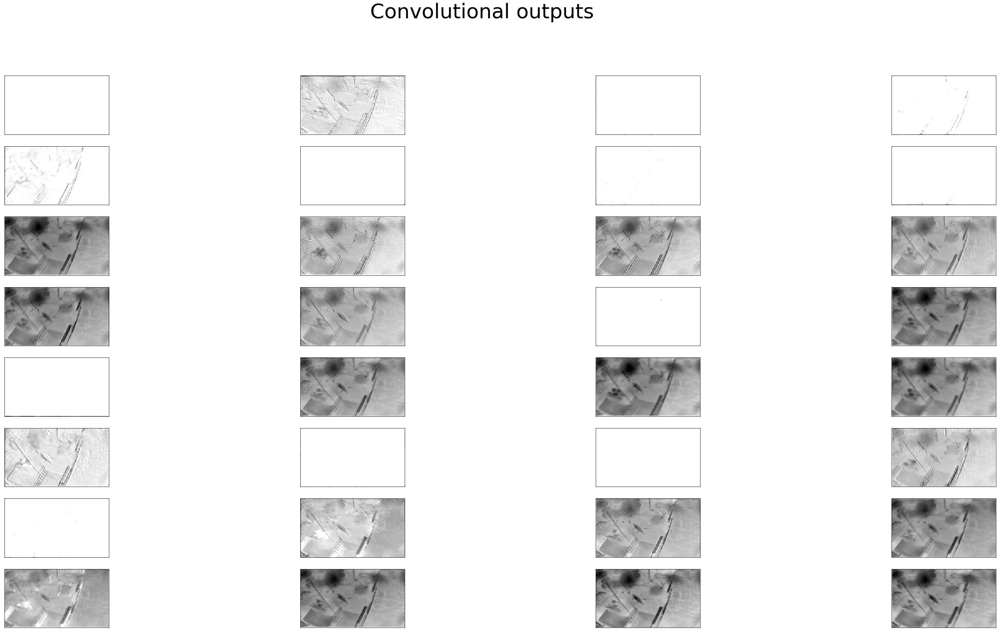

In [102]:
plot_outputs(test_image, baseline_model.layers[0], baseline_model.layers[0], rows=8, cols=4)

Output layer shape:(1, 90, 160, 32)
Plotting layer output..


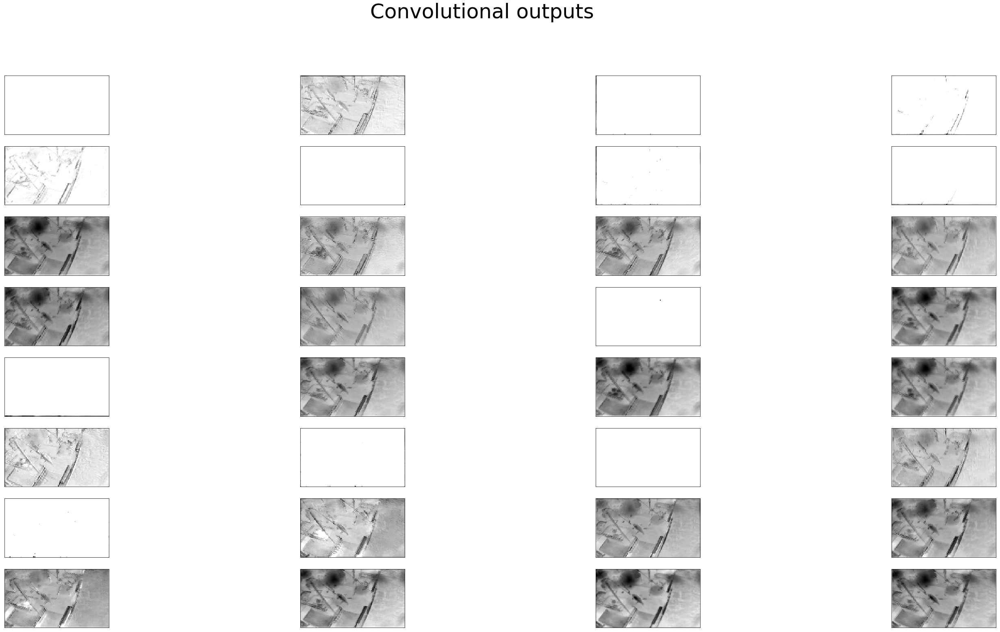

In [103]:
plot_outputs(test_image, baseline_model.layers[0], baseline_model.layers[1], rows=8, cols=4)

Output layer shape:(1, 90, 160, 64)
Plotting layer output..


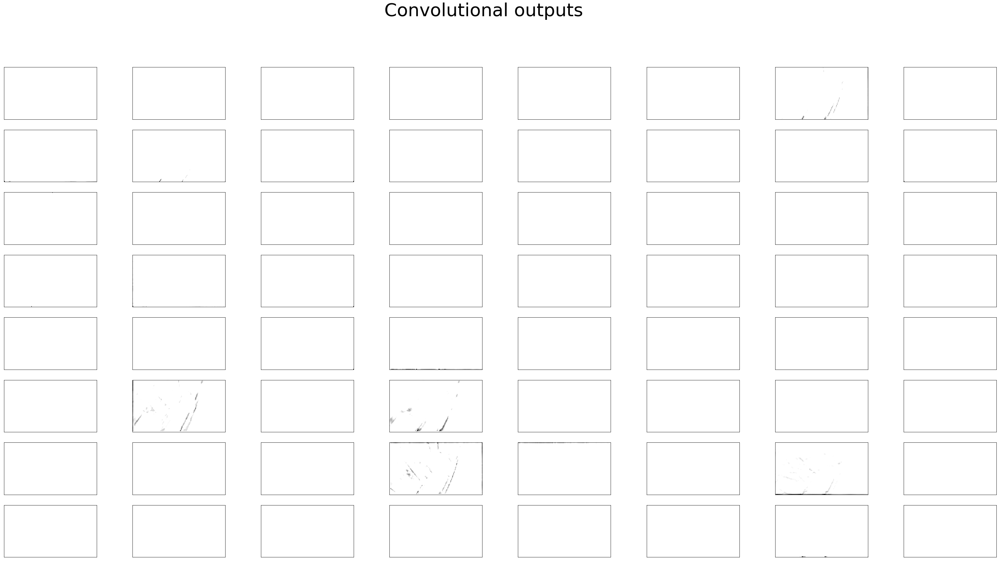

In [104]:
plot_outputs(test_image, baseline_model.layers[0], baseline_model.layers[2], rows=8, cols=8)

We can observe that the first __convolutional__ layer successfully recognizes some parts of the ship and the actualy fish, but in the second output there seems to be a significant loss of information.

### 5. Creating and evaluating a __deeper CNN model__.

Well, the last model obviously suffered from overfitting, so what we can do is make a more complex model: __with more hidden layers and units__. I'll also try to tune the __learning rate__ in a single iteration using __learning rate decay__, which will decrease by $0.5$ for each epoch if the validation accuracy does not increase.

In [51]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=1, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=1e-7)
deep_stopper = EarlyStopping(monitor='loss', patience=5)
deep_checkpointer = ModelCheckpoint('best_model_deep.h5',
                                monitor='val_acc',
                                verbose=1,
                                save_best_only=True,
                                save_weights_only=True)

I'm going to try out 3 different architectures, run them for 1 epoch, see which one is the most promising and try to optimize it.

In [52]:
aug_batch_size = 64
aug_num_epochs = 1
aug_num_steps_per_epoch = 25

First, I'm going to try a deeper CNN with 5 __convolutional layers__, 3 __pooling layers__ and some __dropout__ at the end for __regularization__ and __Batch Normalization__ to avoid __vanishing gradients__. 

In [53]:
deep_model=Sequential()

deep_model.add(Conv2D(32, kernel_size=5, input_shape=(img_w, img_h, num_channels), activation='relu', padding='same'))
deep_model.add(Conv2D(32, kernel_size=5, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))

deep_model.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
deep_model.add(Conv2D(64, kernel_size=3, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))

deep_model.add(Conv2D(96, kernel_size=3, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))
deep_model.add(Dropout(0.2))
deep_model.add(BatchNormalization())


deep_model.add(Flatten())
deep_model.add(Dense(len(fish_classes), activation='softmax'))

optimizer = Adam(lr=0.001)

deep_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
print(deep_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 180, 320, 32)      2432      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 180, 320, 32)      25632     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 90, 160, 32)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 90, 160, 64)       18496     
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 90, 160, 64)       36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 45, 80, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 45, 80, 96)        55392     
__________

In [63]:
#deep_hist = deep_model.fit_generator(idg.flow(fish_train_features_bal, fish_train_labels_bal_ohc, 
#                                                          batch_size=aug_batch_size),
#                        epochs=aug_num_epochs,
#                        validation_data=[fish_val_features, fish_val_labels_ohc],
#                        steps_per_epoch=aug_num_steps_per_epoch,
#                        callbacks=[deep_checkpointer, learning_rate_reduction, deep_stopper])

Epoch 1/1
24/25 [===========================>..] - ETA: 19s - loss: 1.9313 - acc: 0.3027
Epoch 00001: val_acc improved from 0.15344 to 0.18519, saving model to best_model_deep.h5
25/25 [==============================] - 535s 21s/step - loss: 1.9243 - acc: 0.3069 - val_loss: 2.0182 - val_acc: 0.1852


This model seems promising, but let's try to find a more complex one.

Next, I'm going to try adding another __convolutional layer__ to increase the complexity even more and increase the dropout a little bit..

In [56]:
deep_model=Sequential()

deep_model.add(Conv2D(32, kernel_size=5, input_shape=(img_w, img_h, num_channels), activation='relu', padding='same'))
deep_model.add(Conv2D(32, kernel_size=5, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))

deep_model.add(Conv2D(64, kernel_size=5, activation='relu', padding='same'))
deep_model.add(Conv2D(64, kernel_size=5, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))

deep_model.add(Conv2D(96, kernel_size=3, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))
deep_model.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))
deep_model.add(Dropout(0.3))
deep_model.add(BatchNormalization())


deep_model.add(Flatten())
deep_model.add(Dense(len(fish_classes), activation='softmax'))

optimizer = Adam(lr=0.001)

deep_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
print(deep_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 180, 320, 32)      2432      
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 180, 320, 32)      25632     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 90, 160, 32)       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 90, 160, 64)       51264     
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 90, 160, 64)       102464    
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 45, 80, 64)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 45, 80, 96)        55392     
__________

In [206]:
#deep_hist = deep_model.fit_generator(idg.flow(fish_train_features_bal, fish_train_labels_bal_ohc, 
#                                                          batch_size=aug_batch_size),
#                        epochs=aug_num_epochs,
#                        validation_data=[fish_val_features, fish_val_labels_ohc],
#                        steps_per_epoch=aug_num_steps_per_epoch,
#                        callbacks=[deep_checkpointer, learning_rate_reduction, deep_stopper])

Epoch 1/1
24/25 [===========================>..] - ETA: 25s - loss: 1.8908 - acc: 0.2839
Epoch 00001: val_acc improved from 0.18519 to 0.21958, saving model to best_model_deep.h5
25/25 [==============================] - 706s 28s/step - loss: 1.8890 - acc: 0.2863 - val_loss: 2.0048 - val_acc: 0.2196


This model seems to close the generalization gap the most and looks very promising.

Finally, I'll try a similar deep model, but with more hidden units and two __dropout__ and __regularization__ layers.

In [57]:
deep_model=Sequential()

deep_model.add(Conv2D(32, kernel_size=7, input_shape=(img_w, img_h, num_channels), activation='relu', padding='same'))
deep_model.add(Conv2D(64, kernel_size=7, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))

deep_model.add(Conv2D(96, kernel_size=5, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))
deep_model.add(Dropout(0.3))
deep_model.add(BatchNormalization())

deep_model.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
deep_model.add(Conv2D(256, kernel_size=3, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))

deep_model.add(Dropout(0.3))
deep_model.add(BatchNormalization())


deep_model.add(Flatten())
deep_model.add(Dense(len(fish_classes), activation='softmax'))

optimizer = Adam(lr=0.001)

deep_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
print(deep_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 180, 320, 32)      4736      
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 180, 320, 64)      100416    
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 90, 160, 64)       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 90, 160, 96)       153696    
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 45, 80, 96)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 45, 80, 96)        0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 45, 80, 96)        384       
__________

In [208]:
#deep_hist = deep_model.fit_generator(idg.flow(fish_train_features_bal, fish_train_labels_bal_ohc, 
#                                                          batch_size=aug_batch_size),
#                        epochs=aug_num_epochs,
#                        validation_data=[fish_val_features, fish_val_labels_ohc],
#                        steps_per_epoch=aug_num_steps_per_epoch,
#                       callbacks=[deep_checkpointer, learning_rate_reduction, deep_stopper])

Epoch 1/1
24/25 [===========================>..] - ETA: 47s - loss: 6.6699 - acc: 0.2624 
Epoch 00001: val_acc did not improve from 0.21958
25/25 [==============================] - 1287s 51s/step - loss: 6.7009 - acc: 0.2613 - val_loss: 14.1991 - val_acc: 0.0529


This model may suffer from overfitting as the loss functions already start to differ greatly. __The most promising out of the 3 was the second model__, so let's iterate over it some more.

In [58]:
deep_model=Sequential()

deep_model.add(Conv2D(32, kernel_size=5, input_shape=(img_w, img_h, num_channels), activation='relu', padding='same'))
deep_model.add(Conv2D(32, kernel_size=5, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))

deep_model.add(Conv2D(64, kernel_size=5, activation='relu', padding='same'))
deep_model.add(Conv2D(64, kernel_size=5, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))

deep_model.add(Conv2D(96, kernel_size=3, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))
deep_model.add(Conv2D(128, kernel_size=3, activation='relu', padding='same'))
deep_model.add(MaxPool2D(2))
deep_model.add(Dropout(0.3))
deep_model.add(BatchNormalization())


deep_model.add(Flatten())
deep_model.add(Dense(len(fish_classes), activation='softmax'))

optimizer = Adam(lr=0.001)

deep_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
print(deep_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 180, 320, 32)      2432      
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 180, 320, 32)      25632     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 90, 160, 32)       0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 90, 160, 64)       51264     
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 90, 160, 64)       102464    
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 45, 80, 64)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 45, 80, 96)        55392     
__________

In [59]:
aug_batch_size = 64
aug_num_epochs = 15
aug_num_steps_per_epoch = 25

In [212]:
#deep_hist = deep_model.fit_generator(idg.flow(fish_train_features_bal, fish_train_labels_bal_ohc, 
#                                                          batch_size=aug_batch_size),
#                        epochs=aug_num_epochs,
#                        validation_data=[fish_val_features, fish_val_labels_ohc],
#                        steps_per_epoch=aug_num_steps_per_epoch,
#                        callbacks=[deep_checkpointer, learning_rate_reduction, deep_stopper])

Epoch 1/15
24/25 [===========================>..] - ETA: 26s - loss: 2.0362 - acc: 0.2214
Epoch 00001: val_acc did not improve from 0.21958
25/25 [==============================] - 708s 28s/step - loss: 2.0280 - acc: 0.2263 - val_loss: 2.0699 - val_acc: 0.1376
Epoch 2/15
24/25 [===========================>..] - ETA: 26s - loss: 1.7326 - acc: 0.3783
Epoch 00002: val_acc improved from 0.21958 to 0.42063, saving model to best_model_deep.h5
25/25 [==============================] - 711s 28s/step - loss: 1.7330 - acc: 0.3775 - val_loss: 1.9099 - val_acc: 0.4206
Epoch 3/15
24/25 [===========================>..] - ETA: 25s - loss: 1.6580 - acc: 0.3887
Epoch 00003: val_acc improved from 0.42063 to 0.43386, saving model to best_model_deep.h5
25/25 [==============================] - 703s 28s/step - loss: 1.6501 - acc: 0.3938 - val_loss: 1.8583 - val_acc: 0.4339
Epoch 4/15
24/25 [===========================>..] - ETA: 26s - loss: 1.5962 - acc: 0.4329
Epoch 00004: val_acc improved from 0.43386 to 0

The validation accuracy is actually a little bit less than the base model, but this one seems to produce more stable results. Let's save the weights and evaluate it.

In [60]:
#deep_model.save_weights('best_model_deep_end.h5')

In [61]:
#save_hist('deep_hist.json', str(deep_hist.history))
deep_hist = load_hist('deep_hist.json')
deep_model.load_weights('best_model_deep.h5')

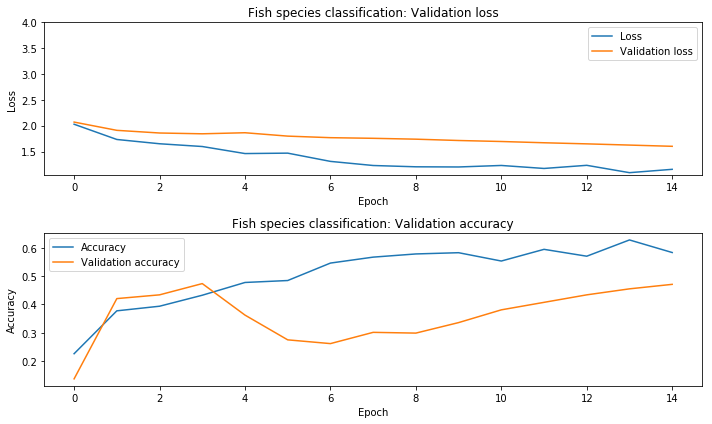

Plotting confusion matrix and report for validation data..
Classification report
              precision    recall  f1-score   support

         ALB       0.51      0.85      0.63       172
         BET       0.57      0.20      0.30        20
         DOL       0.00      0.00      0.00        12
         LAG       0.00      0.00      0.00         7
         NoF       0.00      0.00      0.00        46
       OTHER       0.00      0.00      0.00        30
       SHARK       0.00      0.00      0.00        18
         YFT       0.35      0.40      0.37        73

   micro avg       0.47      0.47      0.47       378
   macro avg       0.18      0.18      0.16       378
weighted avg       0.33      0.47      0.38       378



c:\users\user\appdata\local\conda\conda\envs\tf\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Loss: 1.8428647455084262, Accuracy: 0.4735449737026578
Confusion matrix.


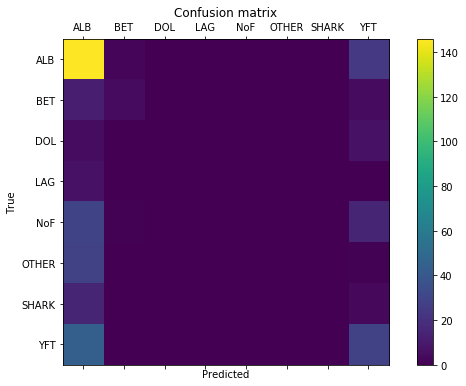

Test errors visualization
Amount of test errors: 199


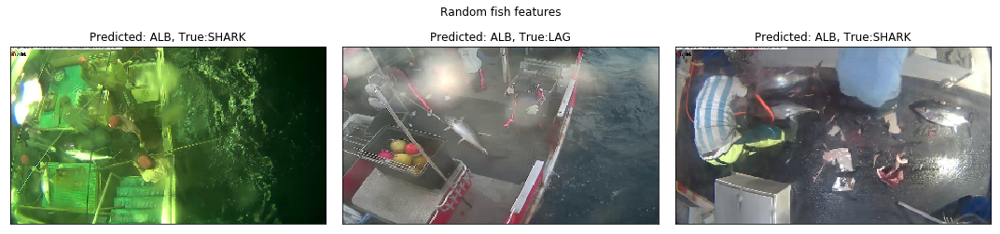

Plotting confusion matrix and report for test data..
Classification report
              precision    recall  f1-score   support

         ALB       0.49      0.87      0.63        31
         BET       1.00      0.25      0.40         4
         DOL       0.00      0.00      0.00         2
         LAG       0.00      0.00      0.00         1
         NoF       0.00      0.00      0.00         9
       OTHER       0.00      0.00      0.00         5
       SHARK       0.00      0.00      0.00         3
         YFT       0.42      0.38      0.40        13

   micro avg       0.49      0.49      0.49        68
   macro avg       0.24      0.19      0.18        68
weighted avg       0.36      0.49      0.39        68

Loss: 1.8381009452483232, Accuracy: 0.4852941176470588
Confusion matrix.


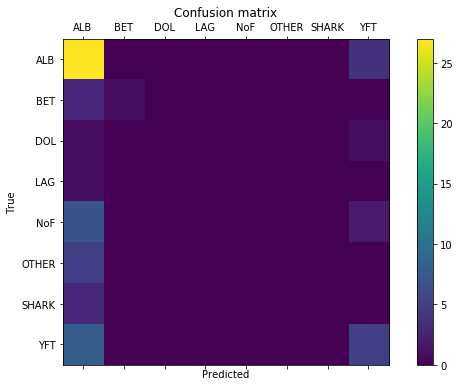

Test errors visualization
Amount of test errors: 35


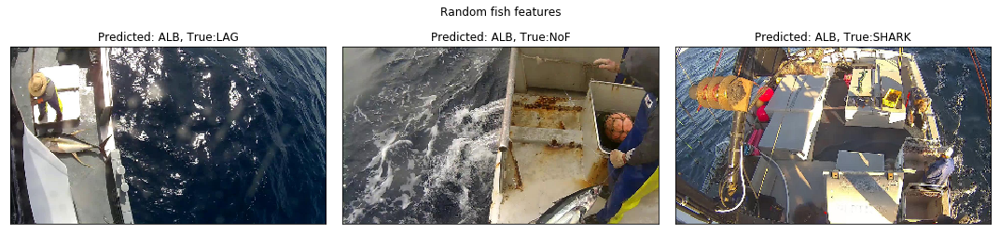

In [62]:
eval_model(deep_hist, deep_model, fish_test_features, fish_test_labels_ohc, fish_val_features, fish_val_labels_ohc, loaded=True, top_lim=None)

Well, the learning curve are steeper, but the performance is definitely way worse than the base model. The main issue is that the model fails to recognise __5 out of the 8__ categories, which is unacceptable. Let's see what the kernels and outputs look like.

In [63]:
deep_model.layers

Filter shape:(5, 5, 3, 32)
Plotting convolutional weights..


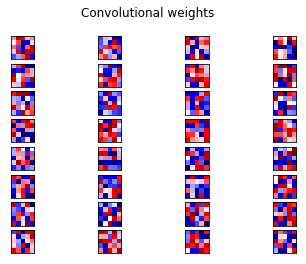

In [64]:
plot_weights(deep_model.layers[0], rows=8, cols=4)

Filter shape:(5, 5, 32, 32)
Plotting convolutional weights..


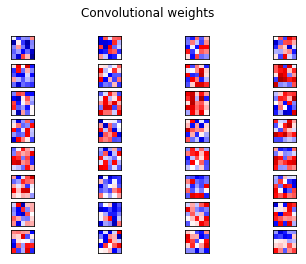

In [65]:
plot_weights(deep_model.layers[1], rows=8, cols=4)

Filter shape:(5, 5, 32, 64)
Plotting convolutional weights..


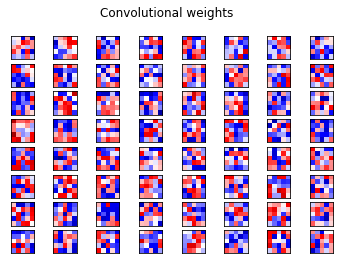

In [66]:
plot_weights(deep_model.layers[3], rows=8, cols=8)

Filter shape:(5, 5, 64, 64)
Plotting convolutional weights..


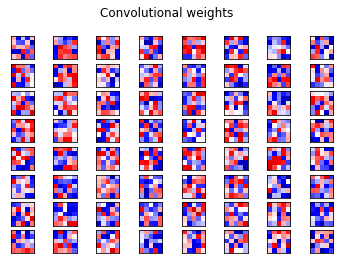

In [67]:
plot_weights(deep_model.layers[4], rows=8, cols=8)

Filter shape:(3, 3, 64, 96)
Plotting convolutional weights..


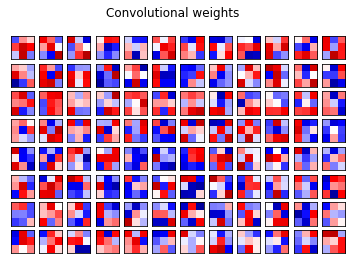

In [68]:
plot_weights(deep_model.layers[6], rows=8, cols=12)

Filter shape:(3, 3, 96, 128)
Plotting convolutional weights..


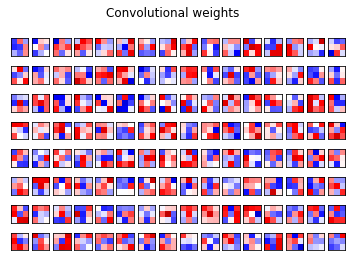

In [69]:
plot_weights(deep_model.layers[8], rows=8, cols=16)

The kernels seem relatively balanced, so let's look at the outputs.

Output layer shape:(1, 180, 320, 32)
Plotting layer output..


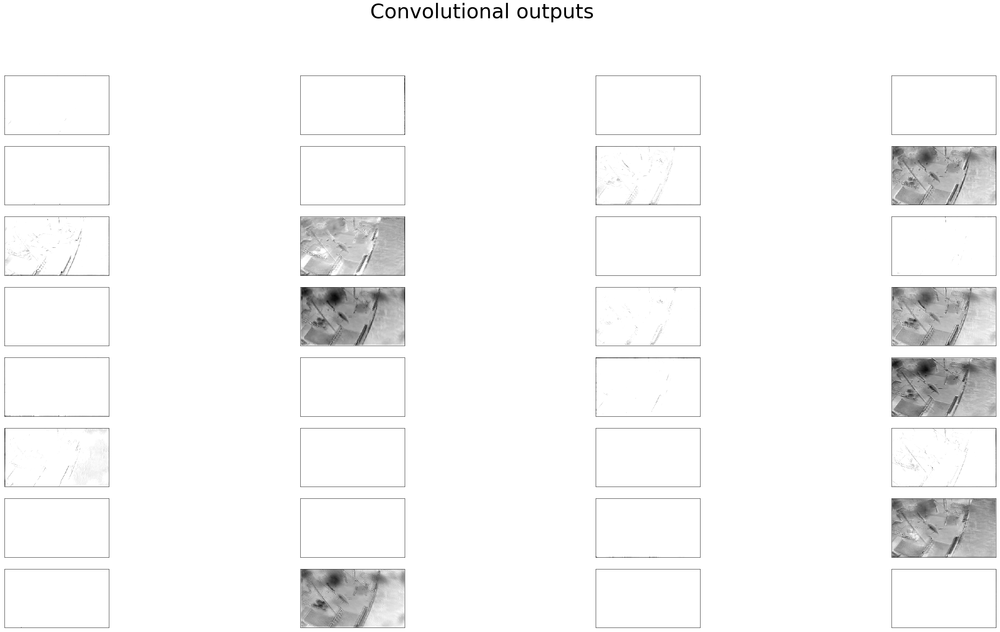

In [70]:
plot_outputs(test_image, deep_model.layers[0], deep_model.layers[0], rows=8, cols=4)

Output layer shape:(1, 90, 160, 64)
Plotting layer output..


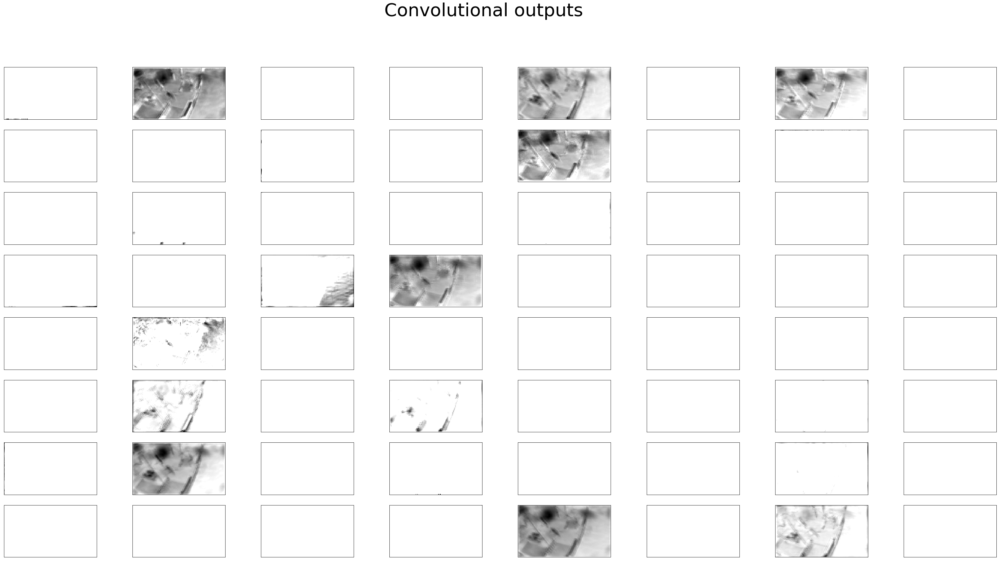

In [71]:
plot_outputs(test_image, deep_model.layers[0], deep_model.layers[3], rows=8, cols=8)

Output layer shape:(1, 45, 80, 96)
Plotting layer output..


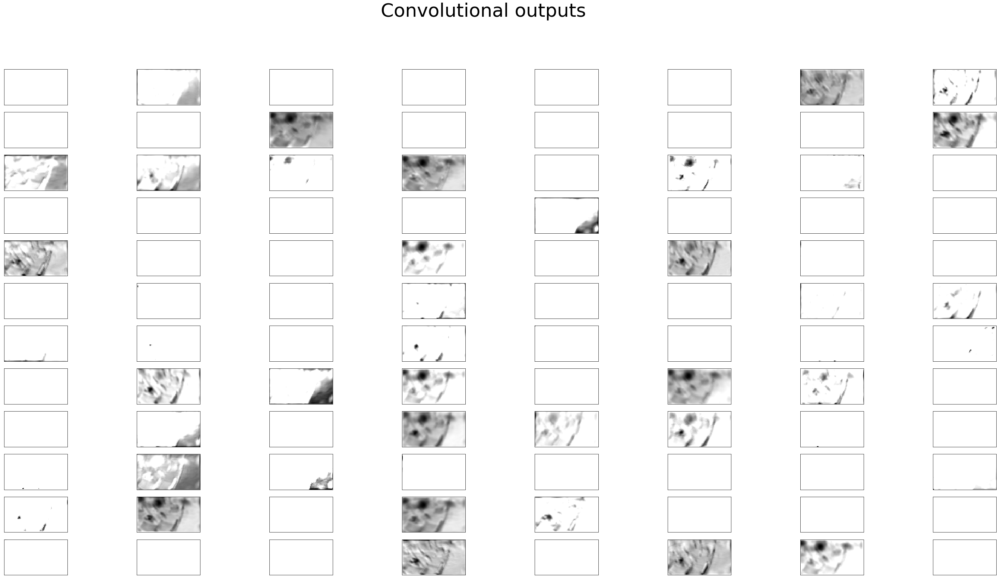

In [72]:
plot_outputs(test_image, deep_model.layers[0], deep_model.layers[6], rows=12, cols=8)

Some units detect parts of the ship, but others fail to detect anything. This model seems to be __underfit__ as well. Instead of increasing the model complexity, let's try out a different approach - __transfer learning__.

### 6. Applying transfer learning using __VGG19__ to classify the species.

I'll try out VGG19, since it's one of the most consistent and simple architectures. First, I'll use __Keras__ to download the model, specifying custom image shapes and confirm that the model looks fine, by printing the summary.

In [73]:
vgg19_model = VGG19(include_top=False, input_shape=(img_w, img_h, num_channels))

In [74]:
vgg19_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 180, 320, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 180, 320, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 180, 320, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 90, 160, 64)       0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 90, 160, 128)      73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 90, 160, 128)      147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 45, 80, 128)       0         
__________

Next we'll choose a starting __learning rate__ and simply add a custom __FC__ layer that output the classes that we need.

In [75]:
optimizer = Adam(lr=1e-4)
transfer_model = Sequential()
transfer_model.add(vgg19_model)
transfer_model.add(Flatten())
transfer_model.add(Dense(len(fish_classes), activation='softmax'))
transfer_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
print(transfer_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Model)                (None, 5, 10, 512)        20024384  
_________________________________________________________________
flatten_5 (Flatten)          (None, 25600)             0         
_________________________________________________________________
dense_5 (Dense)              (None, 8)                 204808    
Total params: 20,229,192
Trainable params: 20,229,192
Non-trainable params: 0
_________________________________________________________________
None


I will also add similar callbacks as before - the __learning rate decay__ object will this time monitor the __validation loss__.

In [76]:
transfer_reduction = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=1, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=1e-7)
transfer_stopper = EarlyStopping(monitor='val_loss', patience=3)
transfer_checkpointer = ModelCheckpoint('best_model_transfer.h5',
                                monitor='val_acc',
                                verbose=1,
                                save_best_only=True,
                                save_weights_only=True)

This time, I will decrease the steps per epoch to __10__, because training will be time-consuming.

In [77]:
aug_batch_size = 64
aug_num_epochs = 15
aug_num_steps_per_epoch = 10

In [200]:
#transfer_hist = transfer_model.fit_generator(idg.flow(fish_train_features_bal, fish_train_labels_bal_ohc, 
#                                                          batch_size=aug_batch_size),
#                        epochs=aug_num_epochs,
#                        validation_data=[fish_val_features, fish_val_labels_ohc],
#                        steps_per_epoch=aug_num_steps_per_epoch,
#                        callbacks=[transfer_reduction, transfer_stopper, transfer_checkpointer])

Epoch 1/15
 9/10 [==========================>...] - ETA: 1:24 - loss: 1.9141 - acc: 0.2899
Epoch 00001: val_acc improved from 0.16667 to 0.24074, saving model to best_model_transfer.h5
10/10 [==============================] - 1019s 102s/step - loss: 1.9049 - acc: 0.2953 - val_loss: 1.9133 - val_acc: 0.2407
Epoch 2/15
 9/10 [==========================>...] - ETA: 1:30 - loss: 1.8200 - acc: 0.3299
Epoch 00002: val_acc did not improve from 0.24074
10/10 [==============================] - 1103s 110s/step - loss: 1.8385 - acc: 0.3250 - val_loss: 1.8204 - val_acc: 0.2143
Epoch 3/15
 9/10 [==========================>...] - ETA: 1:32 - loss: 1.6520 - acc: 0.3750
Epoch 00003: val_acc improved from 0.24074 to 0.36772, saving model to best_model_transfer.h5
10/10 [==============================] - 1113s 111s/step - loss: 1.6589 - acc: 0.3672 - val_loss: 1.6368 - val_acc: 0.3677
Epoch 4/15
 9/10 [==========================>...] - ETA: 1:21 - loss: 1.4796 - acc: 0.4566
Epoch 00004: ReduceLROnPlatea

The __VGG19__ model definitely shows improvement over the other two models. Let's save the weights and history and plot the results. _Note: Evaluating the validation set takes some time._

In [78]:
#joblib.dump(transfer_hist.history, 'transfer_hist.jbl')
transfer_hist_loaded = joblib.load('transfer_hist.jbl')
transfer_model.load_weights('best_model_transfer.h5')

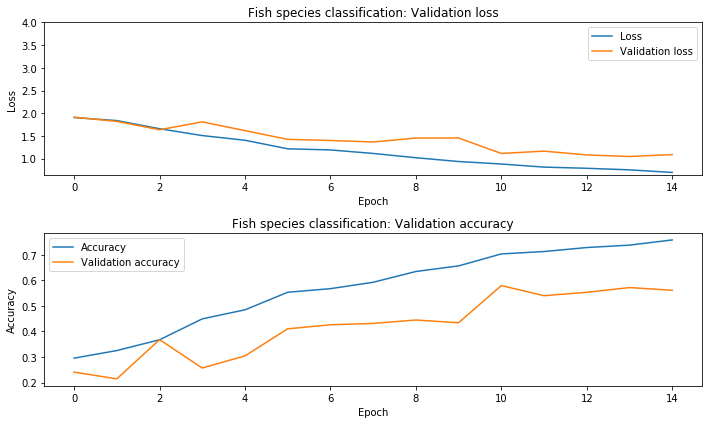

Plotting confusion matrix and report for validation data..
Classification report
              precision    recall  f1-score   support

         ALB       0.76      0.51      0.61       172
         BET       0.39      0.75      0.52        20
         DOL       0.69      0.92      0.79        12
         LAG       0.33      1.00      0.50         7
         NoF       0.53      0.70      0.60        46
       OTHER       0.50      0.53      0.52        30
       SHARK       0.39      1.00      0.56        18
         YFT       0.65      0.45      0.53        73

   micro avg       0.58      0.58      0.58       378
   macro avg       0.53      0.73      0.58       378
weighted avg       0.64      0.58      0.58       378

Loss: 1.1150080949541121, Accuracy: 0.5793650806265533
Confusion matrix.


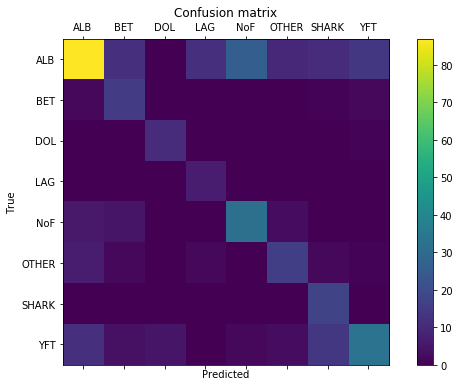

Test errors visualization
Amount of test errors: 159


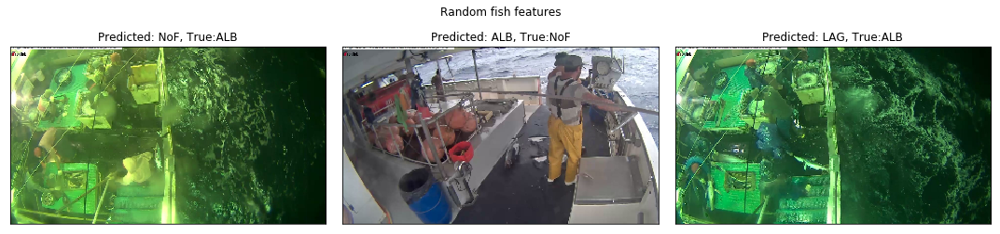

Plotting confusion matrix and report for test data..
Classification report
              precision    recall  f1-score   support

         ALB       0.78      0.58      0.67        31
         BET       0.60      0.75      0.67         4
         DOL       1.00      1.00      1.00         2
         LAG       1.00      1.00      1.00         1
         NoF       0.58      0.78      0.67         9
       OTHER       0.33      0.40      0.36         5
       SHARK       0.33      1.00      0.50         3
         YFT       0.80      0.62      0.70        13

   micro avg       0.65      0.65      0.65        68
   macro avg       0.68      0.77      0.69        68
weighted avg       0.71      0.65      0.66        68

Loss: 1.092654740109163, Accuracy: 0.6470588235294118
Confusion matrix.


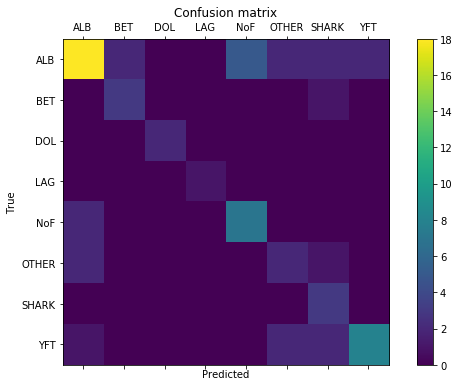

Test errors visualization
Amount of test errors: 24


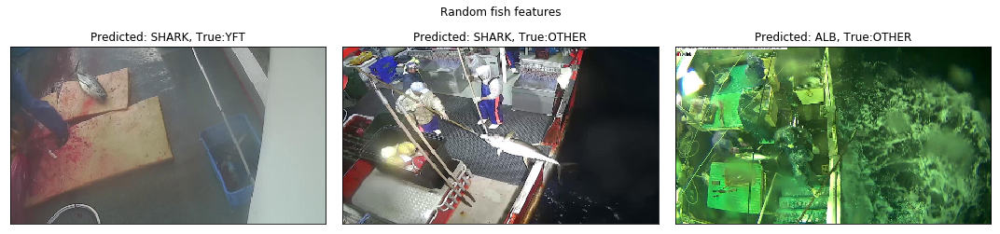

In [79]:
eval_model(transfer_hist_loaded, transfer_model, test_features=fish_test_features, test_labels=fish_test_labels_ohc,
          val_features=fish_val_features, val_labels=fish_val_labels_ohc, top_lim=None, loaded=True)

The learning curve show much better results, the classification report is a lot more balanced and even recognizes classes with __one or two__ samples. The errors are mostly related to detecting whether a fish is present in the image or not. Overall, this model is a nice improvement to the previous ones.

In [80]:
transfer_model.layers

Filter shape:(3, 3, 3, 64)
Plotting convolutional weights..


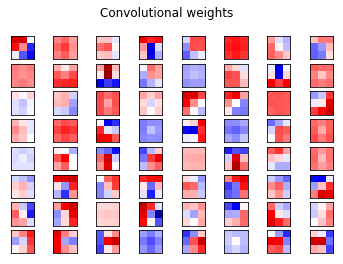

In [81]:
plot_weights(transfer_model.layers[0], rows=8, cols=8)

The pixel values of the kernels seem less random and more closely related to each other.

In [82]:
vgg19_model.layers

Output layer shape:(1, 180, 320, 64)
Plotting layer output..


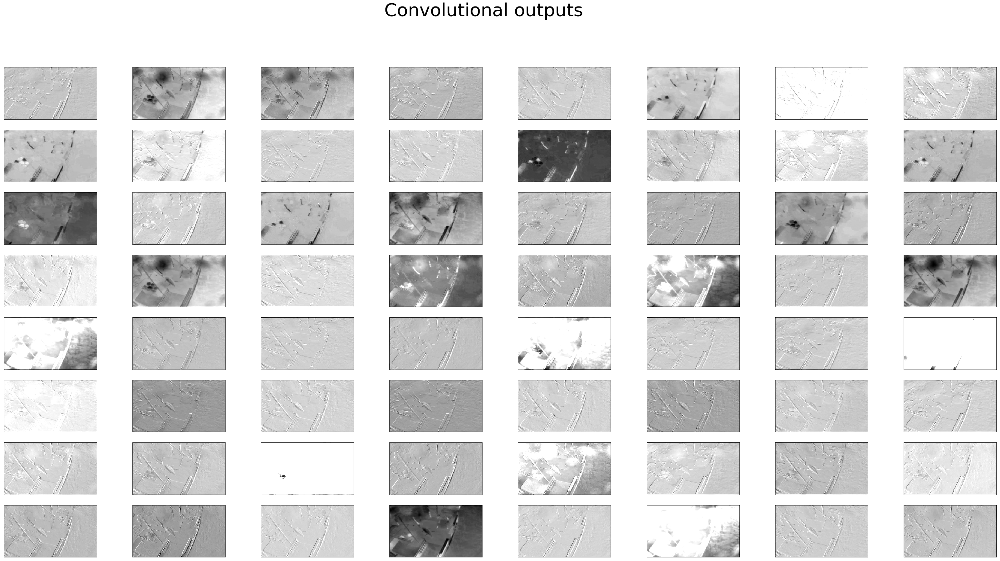

In [83]:
plot_outputs(test_image, vgg19_model.layers[1], vgg19_model.layers[1], rows=8, cols=8)

We can see that all of the units have some sort of interpretation of the test image - mainly detecting the corners and edges and outlining the ship.

Output layer shape:(1, 45, 80, 256)
Plotting layer output..


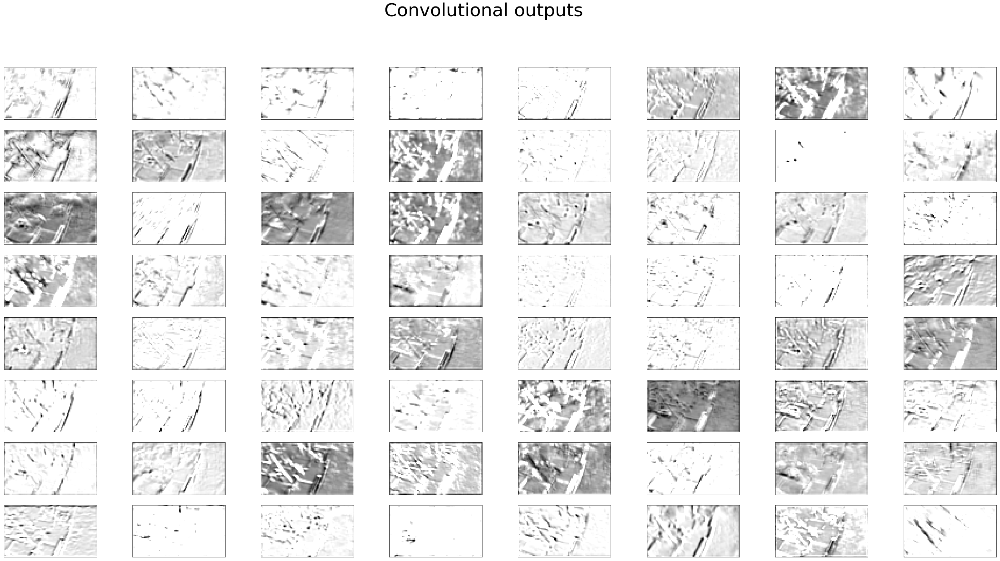

In [84]:
plot_outputs(test_image, vgg19_model.layers[1], vgg19_model.layers[7], rows=8, cols=8)

The deeper convolutional layers start to detect specific regions of the ship.

Output layer shape:(1, 22, 40, 256)
Plotting layer output..


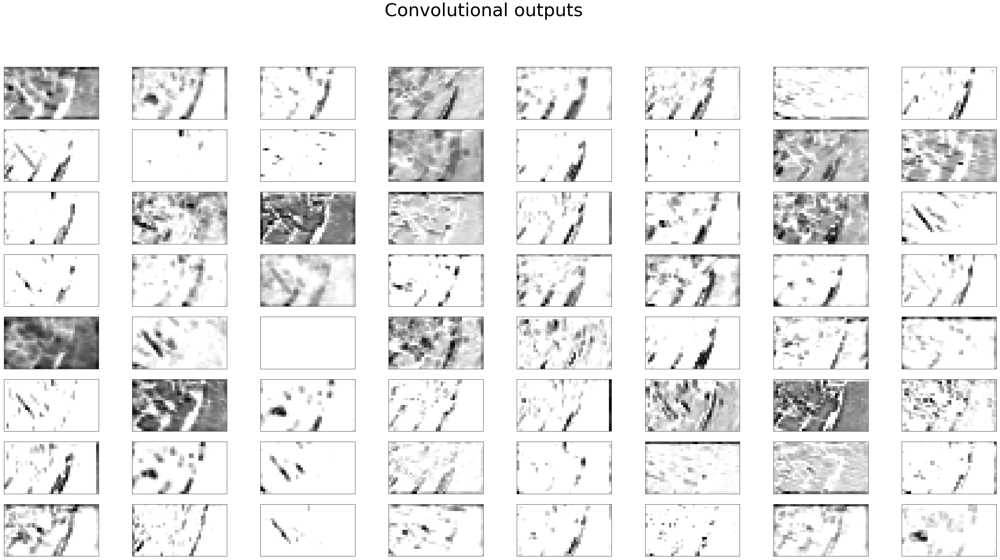

In [85]:
plot_outputs(test_image, vgg19_model.layers[1], vgg19_model.layers[11], rows=8, cols=8)

The regions are even more clearly outlined. Here's the test image again for reference.

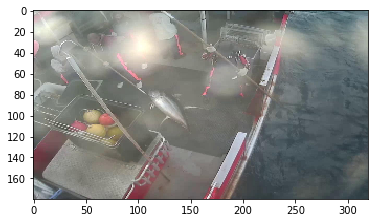

In [86]:
plot_single(test_image)

### Conclusion

In conclusion, I attempted to implement a __Convolutional Neural Network__ to classify the species of fish that are present in the camera frames. To achieve this, I implemented a shallow baseline model as a start, optimized it up to a certain extent and then used __Transfer Learning__ to create an even better model. The best achieved accuracy was __57.9%__, which isn't bad considering there are __8 classes (random guessing amounts to 12.5%)__.

### Future improvements

In the future, I plan to:
 - Perform more detailed hyperparameter optimization on the best model (tuning the hidden layers, units, batch sizes, learning rate and the data generation).
 - Run the model longer and get more stable results.
 - Perform object localization - draw a bounding box around the detected fish and output the class probability.

### Resources

- https://leonardoaraujosantos.gitbooks.io/artificial-inteligence/content/object_localization_and_detection.html - A nice paper on image classification and detection
- https://towardsdatascience.com/a-walkthrough-of-convolutional-neural-network-7f474f91d7bd - about hyperparameter tuning in CNNs
- https://www.kaggle.com/rafjaa/resampling-strategies-for-imbalanced-datasets - dealing with imbalanced data
- https://www.kaggle.com/jeffd23/deep-learning-in-the-deep-blue-lb-1-279 - another CNN approach to this problem
- https://github.com/Hvass-Labs/TensorFlow-Tutorials/blob/master/03C_Keras_API.ipynb - nice convolutional weight and output visualizations

### Communication and contacts

If you have any questions, criticism or suggestions feel free to email me at: dragonflareful@gmail.com. <br>
This project will be shared on my GitHub page: https://github.com/JadeBlue96 and it will be free to fork, use and manipulate to the public.<br>
This project will also be submitted as a kernel at https://www.kaggle.com/c/the-nature-conservancy-fisheries-monitoring/kernels.<br>
I will also appreciate any type of feedback on this matter.

### Acknowledgements

Many thanks to Yordan Darakchiev for his insights and examples on his Machine Learning course at SoftUni.